# Регрессия на доходность первого дня

### Импорты

In [1]:
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import shap

from scipy.stats import spearmanr, pearsonr, kendalltau

import warnings
warnings.filterwarnings("ignore")

### Датафрейм

In [2]:
path = '../../../data/final/pairs.csv'

data = pd.read_csv(path, index_col = 0)
data.head(3)

,views,forwards,thumb_up_react_cnt,thumb_down_react_cnt,mindblowing_react_cnt,heart_react_cnt,thinking_react_cnt,crying_react_cnt,fire_react_cnt,clap_react_cnt,...,free_bird_react_cnt_x_positive_div_by_days,snowman_react_cnt_x_positive_div_by_days,banana_react_cnt_x_positive_div_by_days,poop_react_cnt_x_positive_div_by_days,rofl_smile_react_cnt_x_positive_div_by_days,clown_smile_react_cnt_x_positive_div_by_days,devil_smile_react_cnt_x_positive_div_by_days,hundred_react_cnt_x_positive_div_by_days,head_arm_smile_react_cnt_x_positive_div_by_days,eyes_react_cnt_x_positive_div_by_days
0,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
1,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
2,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0


In [3]:
cols = ['views',
 'forwards',
 'thumb_up_react_cnt',
 'thumb_down_react_cnt',
 'mindblowing_react_cnt',
 'heart_react_cnt',
 'thinking_react_cnt',
 'crying_react_cnt',
 'fire_react_cnt',
 'clap_react_cnt',
 'whale_react_cnt',
 'champaign_react_cnt',
 'heart_fire_react_cnt',
 'okay_react_cnt',
 'smile_stars_react_cnt',
 'smiling_react_cnt',
 'cheers_react_cnt',
 'lovely_smile_react_cnt',
 'drunk_smile_react_cnt',
 'angry_smile_react_cnt',
 'shicked_smile_react_cnt',
 'moos_smile_react_cnt',
 'hotdog_react_cnt',
 'free_bird_react_cnt',
 'snowman_react_cnt',
 'banana_react_cnt',
 'poop_react_cnt',
 'rofl_smile_react_cnt',
 'clown_smile_react_cnt',
 'devil_smile_react_cnt',
 'hundred_react_cnt',
 'head_arm_smile_react_cnt',
 'eyes_react_cnt',
 'days_before_ipo',
 'text_len',
 'price',
 'delta_price',
 'delta_perc',
 'open',
 'delta_open',
 'delta_perc_on_ipo_date',
 'positive_score',
 'views_x_positive',
 'forwards_x_positive',
 'thumb_up_react_cnt_x_positive',
 'thumb_down_react_cnt_x_positive',
 'mindblowing_react_cnt_x_positive',
 'heart_react_cnt_x_positive',
 'thinking_react_cnt_x_positive',
 'crying_react_cnt_x_positive',
 'fire_react_cnt_x_positive',
 'clap_react_cnt_x_positive',
 'whale_react_cnt_x_positive',
 'champaign_react_cnt_x_positive',
 'heart_fire_react_cnt_x_positive',
 'okay_react_cnt_x_positive',
 'smile_stars_react_cnt_x_positive',
 'smiling_react_cnt_x_positive',
 'cheers_react_cnt_x_positive',
 'lovely_smile_react_cnt_x_positive',
 'drunk_smile_react_cnt_x_positive',
 'angry_smile_react_cnt_x_positive',
 'shicked_smile_react_cnt_x_positive',
 'moos_smile_react_cnt_x_positive',
 'hotdog_react_cnt_x_positive',
 'free_bird_react_cnt_x_positive',
 'snowman_react_cnt_x_positive',
 'banana_react_cnt_x_positive',
 'poop_react_cnt_x_positive',
 'rofl_smile_react_cnt_x_positive',
 'clown_smile_react_cnt_x_positive',
 'devil_smile_react_cnt_x_positive',
 'hundred_react_cnt_x_positive',
 'head_arm_smile_react_cnt_x_positive',
 'eyes_react_cnt_x_positive',
 'views_div_by_days',
 'forwards_div_by_days',
 'thumb_up_react_cnt_div_by_days',
 'thumb_down_react_cnt_div_by_days',
 'mindblowing_react_cnt_div_by_days',
 'heart_react_cnt_div_by_days',
 'thinking_react_cnt_div_by_days',
 'crying_react_cnt_div_by_days',
 'fire_react_cnt_div_by_days',
 'clap_react_cnt_div_by_days',
 'whale_react_cnt_div_by_days',
 'champaign_react_cnt_div_by_days',
 'heart_fire_react_cnt_div_by_days',
 'okay_react_cnt_div_by_days',
 'smile_stars_react_cnt_div_by_days',
 'smiling_react_cnt_div_by_days',
 'cheers_react_cnt_div_by_days',
 'lovely_smile_react_cnt_div_by_days',
 'drunk_smile_react_cnt_div_by_days',
 'angry_smile_react_cnt_div_by_days',
 'shicked_smile_react_cnt_div_by_days',
 'moos_smile_react_cnt_div_by_days',
 'hotdog_react_cnt_div_by_days',
 'free_bird_react_cnt_div_by_days',
 'snowman_react_cnt_div_by_days',
 'banana_react_cnt_div_by_days',
 'poop_react_cnt_div_by_days',
 'rofl_smile_react_cnt_div_by_days',
 'clown_smile_react_cnt_div_by_days',
 'devil_smile_react_cnt_div_by_days',
 'hundred_react_cnt_div_by_days',
 'head_arm_smile_react_cnt_div_by_days',
 'eyes_react_cnt_div_by_days',
 'text_len_div_by_days',
 'positive_score_div_by_days',
 'views_x_positive_div_by_days',
 'forwards_x_positive_div_by_days',
 'thumb_up_react_cnt_x_positive_div_by_days',
 'thumb_down_react_cnt_x_positive_div_by_days',
 'mindblowing_react_cnt_x_positive_div_by_days',
 'heart_react_cnt_x_positive_div_by_days',
 'thinking_react_cnt_x_positive_div_by_days',
 'crying_react_cnt_x_positive_div_by_days',
 'fire_react_cnt_x_positive_div_by_days',
 'clap_react_cnt_x_positive_div_by_days',
 'whale_react_cnt_x_positive_div_by_days',
 'champaign_react_cnt_x_positive_div_by_days',
 'heart_fire_react_cnt_x_positive_div_by_days',
 'okay_react_cnt_x_positive_div_by_days',
 'smile_stars_react_cnt_x_positive_div_by_days',
 'smiling_react_cnt_x_positive_div_by_days',
 'cheers_react_cnt_x_positive_div_by_days',
 'lovely_smile_react_cnt_x_positive_div_by_days',
 'drunk_smile_react_cnt_x_positive_div_by_days',
 'angry_smile_react_cnt_x_positive_div_by_days',
 'shicked_smile_react_cnt_x_positive_div_by_days',
 'moos_smile_react_cnt_x_positive_div_by_days',
 'hotdog_react_cnt_x_positive_div_by_days',
 'free_bird_react_cnt_x_positive_div_by_days',
 'snowman_react_cnt_x_positive_div_by_days',
 'banana_react_cnt_x_positive_div_by_days',
 'poop_react_cnt_x_positive_div_by_days',
 'rofl_smile_react_cnt_x_positive_div_by_days',
 'clown_smile_react_cnt_x_positive_div_by_days',
 'devil_smile_react_cnt_x_positive_div_by_days',
 'hundred_react_cnt_x_positive_div_by_days',
 'head_arm_smile_react_cnt_x_positive_div_by_days',
 'eyes_react_cnt_x_positive_div_by_days']

target = '1d_price'

In [4]:
data = data[data[target].notnull()]

X = data[cols]
y = data[target]

### Results collection

In [5]:
results = pd.DataFrame(columns = ['MAPE', 'Spearman', 'Pearson', 'Kendall'])

### Baseline model

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20, random_state=0)

In [7]:
model = LinearRegression()

model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [8]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
kendall_train = round(kendalltau(y_train, y_pred_train)[0], 4)
kendall_test = round(kendalltau(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'baseline_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'baseline_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.0529,0.0763,0.4416,0.0692
baseline_test,0.0545,0.0696,0.1317,0.0626


### Feature selection

1. Null drop
2. Nonsense drop
3. Correlation drop
4. Manual linearization
5. Correlation drop

In [9]:
import sys
sys.path.insert(1, '../../pipeline')

import pipeline as pl

In [10]:
cols = X_train.columns
print(f'{len(cols)} features before pipeline')

143 features before pipeline


### Null drop

In [11]:
cols = pl.null_drop(X, cutoff = 0.5)
print(f'{len(cols)} features remain')

143 features remain


### Nonsense drop

In [12]:
cols = pl.nonsense_drop(X[cols], 0.9)
print(f'{len(cols)} features remain')

47 features remain


In [13]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [14]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.0529,0.0763,0.4416,0.0692
baseline_test,0.0545,0.0696,0.1317,0.0626
after_nonsense_drop_train,0.0541,0.0748,0.4057,0.0692
after_nonsense_drop_test,0.0539,0.0688,0.3365,0.0626


### Soft correlation drop

In [15]:
cols = pl.corr_drop(X[cols], y,  0.8)
print(f'{len(cols)} features remain')

price (0.0509) was removed by open (0.0526)
delta_perc (0.0081) was removed by delta_price (0.0112)
delta_perc_on_ipo_date (0.0081) was removed by delta_price (0.0112)
crying_react_cnt_x_positive_div_by_days (0.018) was removed by crying_react_cnt_div_by_days (0.0346)
smiling_react_cnt_x_positive_div_by_days (0.0297) was removed by smiling_react_cnt_div_by_days (0.0342)
42 features remain


In [16]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [17]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.0529,0.0763,0.4416,0.0692
baseline_test,0.0545,0.0696,0.1317,0.0626
after_nonsense_drop_train,0.0541,0.0748,0.4057,0.0692
after_nonsense_drop_test,0.0539,0.0688,0.3365,0.0626
after_soft_correlation_drop_train,0.0541,0.0745,0.4048,0.0692
after_soft_correlation_drop_test,0.0539,0.0687,0.3461,0.0626


### Manual linearization

In [18]:
best_funcs = []
for col in cols:
    res = pl.linearization(X_train[col], y_train)
    print(f'best func for {col} is {res[0]} ({np.round(res[1], 4)})')
    best_funcs.append(res[0])

best func for views is <ufunc 'sqrt'> (0.0242)
best func for forwards is <ufunc 'sqrt'> (0.0112)
best func for thumb_up_react_cnt is <function <lambda> at 0x7f7ce135cca0> (0.0639)
best func for thumb_down_react_cnt is <function <lambda> at 0x7f7ce135cca0> (0.0389)
best func for heart_react_cnt is <function <lambda> at 0x7f7ce135cca0> (0.0818)
best func for thinking_react_cnt is <function <lambda> at 0x7f7ce135cca0> (0.0501)
best func for crying_react_cnt is <function <lambda> at 0x7f7ce135cca0> (0.008)
best func for fire_react_cnt is <function <lambda> at 0x7f7ce135cca0> (0.0468)
best func for smiling_react_cnt is <function <lambda> at 0x7f7ce135cca0> (0.0205)
best func for days_before_ipo is <ufunc 'square'> (-0.2383)
best func for text_len is <ufunc 'sqrt'> (0.0387)
best func for delta_price is <function <lambda> at 0x7f7ce135c940> (0.0104)
best func for open is <ufunc 'square'> (-0.0381)
best func for delta_open is <function <lambda> at 0x7f7ce135c9d0> (0.0036)
best func for positiv

In [19]:
for i in range(len(cols)):
    X_train[cols[i]] = best_funcs[i](X_train[cols[i]])
    X_test[cols[i]] = best_funcs[i](X_test[cols[i]])

In [20]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [21]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_linearization_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_linearization_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.0529,0.0763,0.4416,0.0692
baseline_test,0.0545,0.0696,0.1317,0.0626
after_nonsense_drop_train,0.0541,0.0748,0.4057,0.0692
after_nonsense_drop_test,0.0539,0.0688,0.3365,0.0626
after_soft_correlation_drop_train,0.0541,0.0745,0.4048,0.0692
after_soft_correlation_drop_test,0.0539,0.0687,0.3461,0.0626
after_linearization_drop_train,0.0449,0.1217,0.5787,0.0692
after_linearization_drop_test,0.0450,0.1196,0.5503,0.0626


### Hard correlation drop

In [22]:
cols = pl.corr_drop(X[cols], y,  0.3)
print(f'{len(cols)} features remain')

forwards (0.0161) was removed by views (0.0376)
thumb_up_react_cnt (0.0325) was removed by views (0.0376)
views (0.0376) was removed by thinking_react_cnt (0.0418)
crying_react_cnt (0.0026) was removed by crying_react_cnt_x_positive (0.0069)
views_x_positive (0.0062) was removed by positive_score (0.0084)
thumb_up_react_cnt_x_positive (0.0036) was removed by positive_score (0.0084)
heart_react_cnt_x_positive (0.0029) was removed by thinking_react_cnt_x_positive (0.0049)
views_div_by_days (0.1483) was removed by forwards_div_by_days (0.1602)
forwards_div_by_days (0.1602) was removed by thumb_up_react_cnt_div_by_days (0.183)
thumb_down_react_cnt_div_by_days (0.0951) was removed by thumb_up_react_cnt_div_by_days (0.183)
heart_react_cnt_div_by_days (0.12) was removed by thumb_up_react_cnt_div_by_days (0.183)
thinking_react_cnt_div_by_days (0.1091) was removed by thumb_up_react_cnt_div_by_days (0.183)
fire_react_cnt_div_by_days (0.1243) was removed by thumb_up_react_cnt_div_by_days (0.183)


In [23]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [24]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.0529,0.0763,0.4416,0.0692
baseline_test,0.0545,0.0696,0.1317,0.0626
after_nonsense_drop_train,0.0541,0.0748,0.4057,0.0692
after_nonsense_drop_test,0.0539,0.0688,0.3365,0.0626
after_soft_correlation_drop_train,0.0541,0.0745,0.4048,0.0692
after_soft_correlation_drop_test,0.0539,0.0687,0.3461,0.0626
after_linearization_drop_train,0.0449,0.1217,0.5787,0.0692
after_linearization_drop_test,0.0450,0.1196,0.5503,0.0626
after_hard_correlation_drop_train,0.0462,0.1105,0.5340,0.0692
after_hard_correlation_drop_test,0.0460,0.1042,0.5030,0.0626


### Forward selection

In [25]:
train_df = X_train
train_df['target'] = y_train
model = LinearRegression

In [26]:
cols = pl.forward_selection_regression(train_df, cols, model, target='target', alpha_in=0.05)

В модель была добавлена переменная text_len_div_by_days, p-value: 0.0
В модель была добавлена переменная text_len, p-value: 0.0
В модель была добавлена переменная heart_react_cnt, p-value: 0.0
В модель была добавлена переменная forwards_x_positive_div_by_days, p-value: 0.0
В модель была добавлена переменная fire_react_cnt, p-value: 0.0
В модель была добавлена переменная forwards_x_positive, p-value: 0.0
В модель была добавлена переменная open, p-value: 0.0
В модель была добавлена переменная crying_react_cnt_div_by_days, p-value: 0.0
В модель была добавлена переменная crying_react_cnt_x_positive, p-value: 0.0
В модель была добавлена переменная delta_price, p-value: 0.0
В модель была добавлена переменная fire_react_cnt_x_positive, p-value: 0.0
В модель была добавлена переменная positive_score, p-value: 0.0034
В модель была добавлена переменная delta_open, p-value: 0.0278


### Итоговые переменные

In [27]:
print(f'total params:{len(cols)}')
cols

total params:13


['text_len_div_by_days',
 'text_len',
 'heart_react_cnt',
 'forwards_x_positive_div_by_days',
 'fire_react_cnt',
 'forwards_x_positive',
 'open',
 'crying_react_cnt_div_by_days',
 'crying_react_cnt_x_positive',
 'delta_price',
 'fire_react_cnt_x_positive',
 'positive_score',
 'delta_open']

### Model

In [28]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [29]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'model_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'model_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.0529,0.0763,0.4416,0.0692
baseline_test,0.0545,0.0696,0.1317,0.0626
after_nonsense_drop_train,0.0541,0.0748,0.4057,0.0692
after_nonsense_drop_test,0.0539,0.0688,0.3365,0.0626
after_soft_correlation_drop_train,0.0541,0.0745,0.4048,0.0692
after_soft_correlation_drop_test,0.0539,0.0687,0.3461,0.0626
after_linearization_drop_train,0.0449,0.1217,0.5787,0.0692
after_linearization_drop_test,0.0450,0.1196,0.5503,0.0626
after_hard_correlation_drop_train,0.0462,0.1105,0.5340,0.0692
after_hard_correlation_drop_test,0.0460,0.1042,0.5030,0.0626


In [30]:
results.to_csv('results/1d_regression.csv')

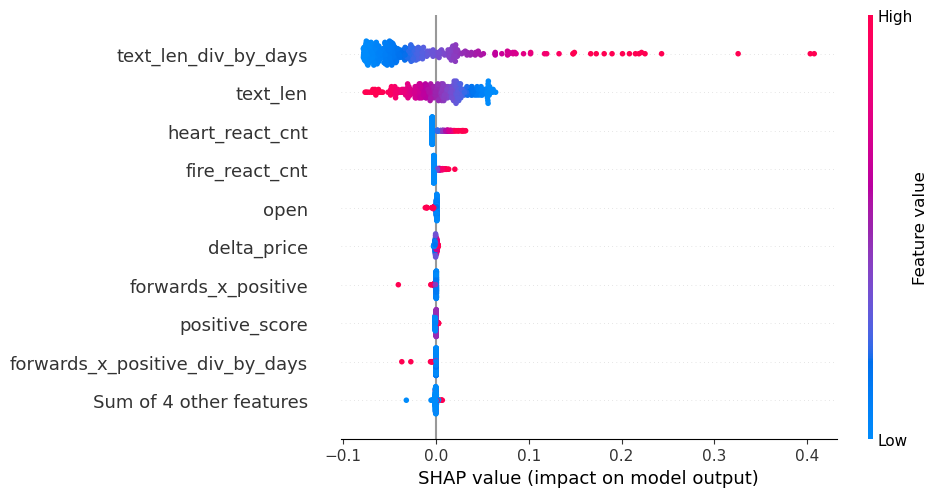

In [31]:
X100 = shap.utils.sample(X_train[cols], 300)

explainer = shap.Explainer(model.predict, X100)
shap_values = explainer(X100)
shap.plots.beeswarm(shap_values)

In [32]:
import statsmodels.api as sm

model = sm.OLS(y, X[cols])
results = model.fit()
results = results.summary()
results

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:               1d_price   R-squared (uncentered):                   0.049
Model:                            OLS   Adj. R-squared (uncentered):              0.049
Method:                 Least Squares   F-statistic:                              166.9
Date:                Sun, 05 May 2024   Prob (F-statistic):                        0.00
Time:                        12:18:01   Log-Likelihood:                          40792.
No. Observations:               42013   AIC:                                 -8.156e+04
Df Residuals:                   42000   BIC:                                 -8.145e+04
Df Model:                          13                                                  
Covariance Type:            nonrobust                                                  
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
text_len_div_by_days                0.0004   1.04e-05     41.706      0.000       0.000       0.000
text_len                         2.251e-06   4.32e-07      5.205      0.000     1.4e-06     3.1e-06
heart_react_cnt                  8.798e-05   2.13e-05      4.130      0.000    4.62e-05       0.000
forwards_x_positive_div_by_days     0.0016      0.000      6.429      0.000       0.001       0.002
fire_react_cnt                      0.0001   2.62e-05      3.851      0.000    4.95e-05       0.000
forwards_x_positive             -6.497e-06   3.91e-06     -1.660      0.097   -1.42e-05    1.17e-06
open                               -0.0002   1.45e-05    -11.176      0.000      -0.000      -0.000
crying_react_cnt_div_by_days        0.0012      0.001      1.530      0.126      -0.000       0.003
crying_react_cnt_x_positive     -5.057e-05   3.33e-05     -1.520      0.129      -0.000    1.46e-05
delta_price                         0.0002      0.000      1.845      0.065   -1.29e-05       0.000
fire_react_cnt_x_positive       -2.467e-05   2.62e-05     -0.941      0.347   -7.61e-05    2.67e-05
positive_score                   1.292e-05      0.001      0.025      0.980      -0.001       0.001
delta_open                          0.0002      0.000      1.731      0.084   -2.45e-05       0.000
==============================================================================
Omnibus:                    22839.892   Durbin-Watson:                   1.647
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           552763.008
Skew:                           2.125   Prob(JB):                         0.00
Kurtosis:                      20.254   Cond. No.                     2.65e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.65e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [33]:
import pickle
 
with open("results/1d_regression.pickle", "wb") as file:
    pickle.dump(results, file)

### Обзор вошедших переменных

In [34]:
cols

['text_len_div_by_days',
 'text_len',
 'heart_react_cnt',
 'forwards_x_positive_div_by_days',
 'fire_react_cnt',
 'forwards_x_positive',
 'open',
 'crying_react_cnt_div_by_days',
 'crying_react_cnt_x_positive',
 'delta_price',
 'fire_react_cnt_x_positive',
 'positive_score',
 'delta_open']

#### text_len_div_by_days

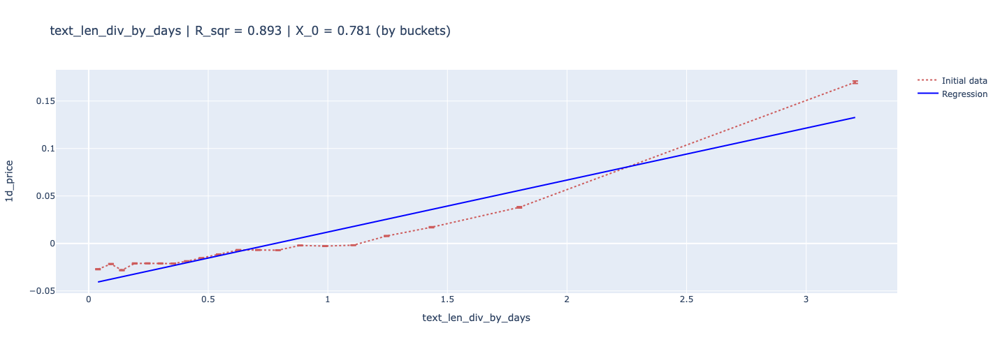

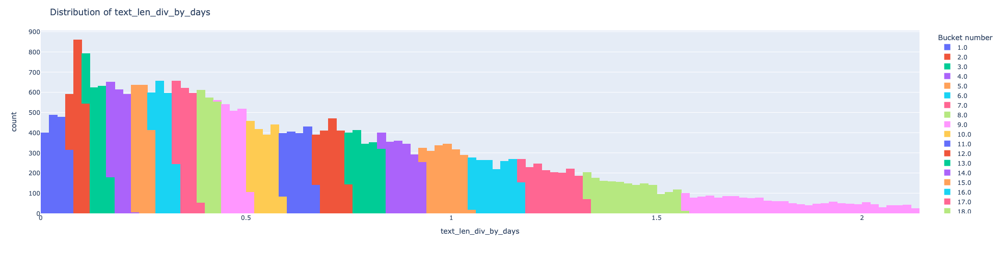

In [35]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='text_len_div_by_days', target_name=target, interactive = False)

#### text_len

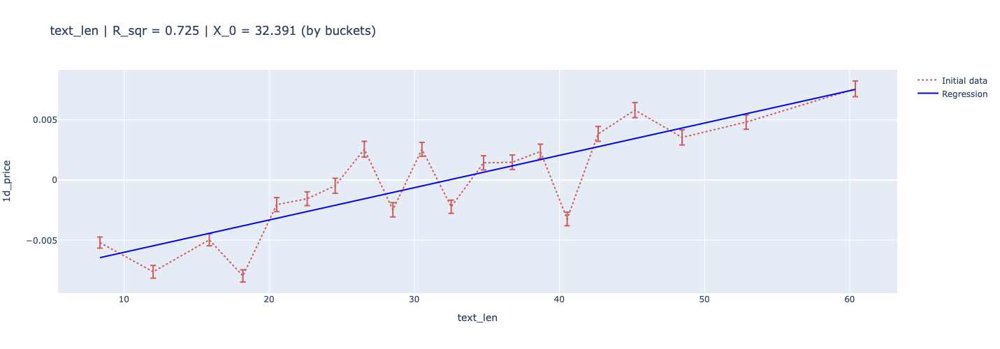

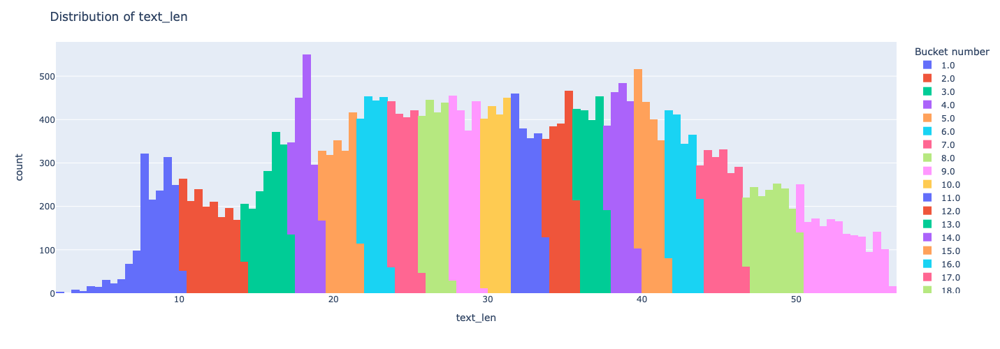

In [43]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='text_len', target_name=target, interactive = False)

#### heart_react_cnt

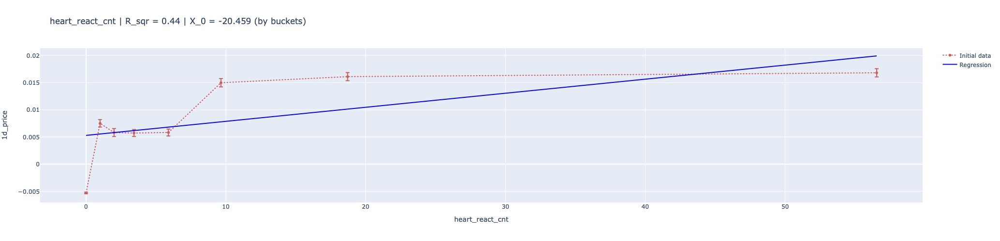

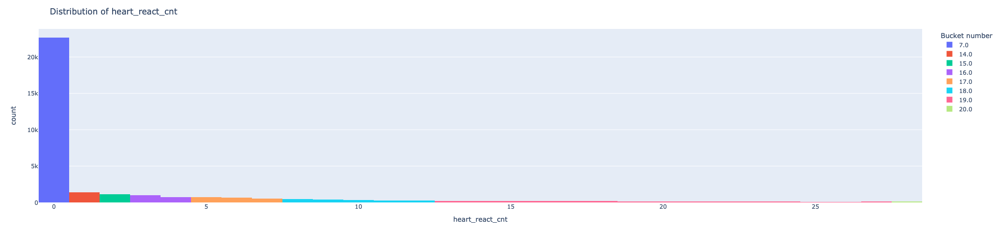

In [12]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='heart_react_cnt', target_name=target, interactive = False)

#### fire_react_cnt

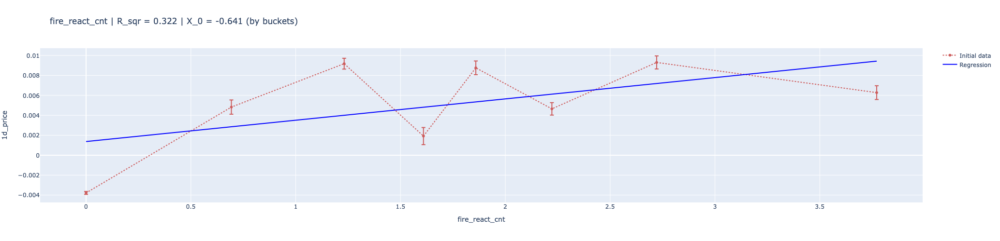

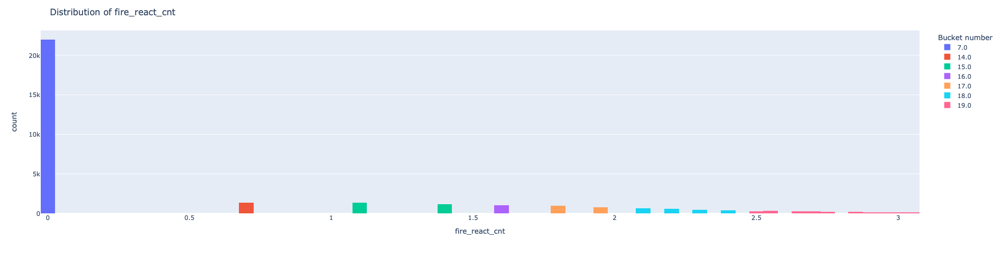

In [38]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='fire_react_cnt', target_name=target, interactive = False)

#### open

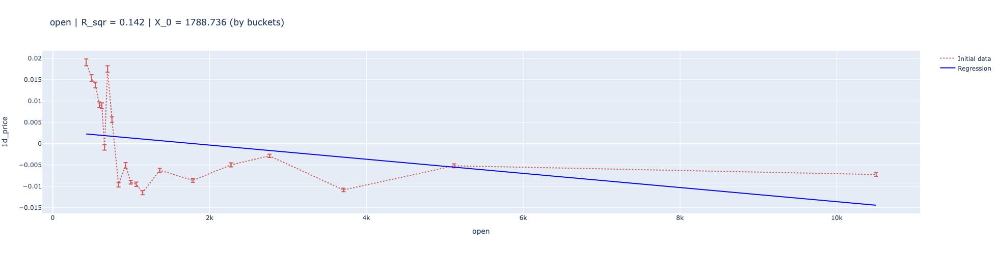

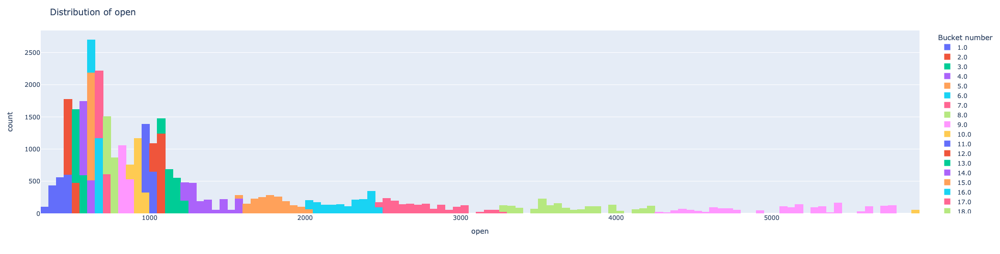

In [42]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='open', target_name=target, interactive = False)